In [1]:
import numpy as np 
import PIL
import os
import cv2
import bisect
import matplotlib.image as mpimg
from skimage.util import random_noise
from scipy.ndimage import gaussian_filter
from numba import jit

from PIL import Image, ImageDraw, ImageStat
import random
import matplotlib.pyplot as plt

# from scipy import ndimage, datasets
import scipy
import scipy.stats
import random

from PIL import Image
from PIL import ImageFilter,ImageEnhance
from PIL import ImageChops
from scipy.ndimage import convolve


## 1

Utils

In [8]:
def sp_noise(image,prob:float=0.05):
    '''
    Add salt and pepper noise to image
    prob: Probability of the noise
    '''
    assert 0 <= prob <= 1, "Probability of the noise must be less or equal to 1 or more or equal to 0"
    output = np.zeros(image.shape,np.uint8)
    thres = 1 - prob 
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random()
            if rdn < prob:
                output[i][j] = 0
            elif rdn > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output
 
def noisy(noise_typ:str,image:np.ndarray,prob:float=0.05) -> np.ndarray:
    """_summary_
    Args:
        noise_typ : str -  One of the following strings, selecting the type of noise to add:
        (*)      'gauss'     Gaussian-distributed additive noise.
        (*)      'poisson'   Poisson-distributed noise generated from the data.
        (*)      's_p'       Replaces random pixels with 0 or 1.
        (*)      'speckle'   Multiplicative noise using out = image + n*image, where  n is uniform noise with specified mean & variance.
        image : ndarray - Input image data. Will be converted to float.
    Returns:
        noisy: ndarray  - noised image
    """
    
    assert 0 <= prob <= 1, "Probability of the noise must be less or equal to 1 or more or equal to 0"
    if noise_typ == "gauss":
        row,col,ch= image.shape
        
        mean = 255/2
        var = 0.1
        sigma = var ** 0.5
        
        gauss = np.random.normal(mean,sigma,(row,col,ch))
        gauss = gauss.reshape(row,col,ch)
        noisy = image + gauss
        return noisy
    
    elif noise_typ == "s_p":
        return sp_noise(image,prob)
    
    elif noise_typ == "poisson":
        vals = len(np.unique(image))
        vals = 2 ** np.ceil(np.log2(vals))
        noisy = np.random.poisson(image * vals) / float(vals)
        return noisy
    
    elif noise_typ =="speckle":
        row,col,ch = image.shape
        gauss = np.random.randn(row,col,ch)
        gauss = gauss.reshape(row,col,ch)        
        noisy = image + image * gauss
        return noisy
    
def imflatfield(I, sigma):
    """Python equivalent imflatfield implementation
       I format must be BGR and type of I must be uint8"""
    A = I.astype(np.float32) / 255  # A = im2single(I);
    Ihsv = cv2.cvtColor(A, cv2.COLOR_BGR2HSV)  # Ihsv = rgb2hsv(A);
    A = Ihsv[:, :, 2]  # A = Ihsv(:,:,3);

    filterSize = int(2*np.ceil(2*sigma) + 1);  # filterSize = 2*ceil(2*sigma)+1;

    # shading = imgaussfilt(A, sigma, 'Padding', 'symmetric', 'FilterSize', filterSize); % Calculate shading
    shading = cv2.GaussianBlur(A, (filterSize, filterSize), sigma, borderType=cv2.BORDER_REFLECT)

    meanVal = np.mean(A)  # meanVal = mean(A(:),'omitnan')

    #% Limit minimum to 1e-6 instead of testing using isnan and isinf after division.
    shading = np.maximum(shading, 1e-6)  # shading = max(shading, 1e-6);

    B = A*meanVal / shading  # B = A*meanVal./shading;

    #% Put processed V channel back into HSV image, convert to RGB
    Ihsv[:, :, 2] = B  # Ihsv(:,:,3) = B;

    B = cv2.cvtColor(Ihsv, cv2.COLOR_HSV2BGR)  # B = hsv2rgb(Ihsv);

    B = np.round(np.clip(B*255, 0, 255)).astype(np.uint8)  # B = im2uint8(B);

    return B
 
def make_noisy_image(OUTPUT_DIR:str,FILE:str,loc:float=0,scale:float=1)-> str:
    img = cv2.imread(FILE)

    # Получение ширины, высоты и количество каналов изображения
    h, w, _ = img.shape

    # Создание сетки из точек вокруг центра изображения
    x, y = np.meshgrid(np.linspace(-1, 1, w), np.linspace(-1, 1, h))

    # Вычисление расстояния каждой точки сетки от центра изображения
    radius = np.sqrt(x**2 + y**2)

    # Нормализация радиуса для создания градиента яркости
    radius = (radius - radius.min()) / (radius.max() - radius.min())
    np.random.normal()
    # Создание маски, которая определяет область имитации неравномерной засветки
    mask = np.random.normal(loc=0,scale=1,size=(h, w))
    mask[radius > 0.95] = 0

    # Накладывание маски на изображение и сохранение результата
    result = cv2.merge([img[:,:,0]*mask, img[:,:,1]*mask, img[:,:,2]*mask])
    cv2.imwrite(os.path.join(OUTPUT_DIR,f"NoiseImage(loc={loc}-scale={scale}).jpg"), result)
    return os.path.join(OUTPUT_DIR,f"NoiseImage(loc={loc}-scale={scale}).jpg")

def make_dark_spot(OUTPUT_DIR:str,FILE:str):
    # Загружаем изображение в оттенках серого
    name = os.path.split(FILE)[-1]
    img_gray = cv2.imread(FILE, cv2.IMREAD_GRAYSCALE)

    # Получаем размеры изображения
    height, width = img_gray.shape

    # Вычисляем центр изображения
    center_x = int(width/2)
    center_y = int(height/2)

    # Создаем новое черное изображение
    result = np.zeros((height, width), np.uint8)

    # Проходимся по всем пикселям изображения
    for x in range(width):
        for y in range(height):
            # Вычисляем расстояние до центра
            distance = ((x - center_x) ** 2 + (y - center_y) ** 2) ** 0.5
            radius = ((height - center_x) ** 2 + (width - center_y) ** 2) ** 0.5
            # Нормализуем расстояние, получаем значение от 0 до 1
            norm_distance = distance / radius
            
            # Вычисляем яркость пикселя на основе обратно пропорционального значения нормализованного расстояния
            brightness = int(255 * (norm_distance)) if norm_distance !=0 else 1e-10
            
            # Применяем яркость к пикселю изображения
            result[y, x] = img_gray[y, x] * brightness // 255

    # Показываем результат и сохраняем его
    cv2.imwrite(os.path.join(OUTPUT_DIR,f"WithDarkSpot_{name}"), result)
    return os.path.join(OUTPUT_DIR,f"WithDarkSpot_{name}")
@jit
def imadjust(src, tol=1, vin=[0,255], vout=(0,255)):
    # src : input one-layer image (numpy array)
    # tol : tolerance, from 0 to 100.
    # vin  : src image bounds
    # vout : dst image bounds
    # return : output img

    assert len(src.shape) == 2 ,'Input image should be 2-dims'

    tol = max(0, min(100, tol))

    if tol > 0:
        # Compute in and out limits
        # Histogram
        hist = np.histogram(src,bins=list(range(256)),range=(0,255))[0]

        # Cumulative histogram
        cum = hist.copy()
        for i in range(1, 256): cum[i] = cum[i - 1] + hist[i]

        # Compute bounds
        total = src.shape[0] * src.shape[1]
        low_bound = total * tol / 100
        upp_bound = total * (100 - tol) / 100
        vin[0] = bisect.bisect_left(cum, low_bound)
        vin[1] = bisect.bisect_left(cum, upp_bound)

    # Stretching
    scale = (vout[1] - vout[0]) / (vin[1] - vin[0])
    vs = src-vin[0]
    vs[src<vin[0]]=0
    vd = vs*scale+0.5 + vout[0]
    vd[vd>vout[1]] = vout[1]
    dst = vd

    return dst

def color_hist(filename):
    img = np.asarray(Image.open(filename).convert("L")).reshape(-1,1)
    return plt.hist(img, bins=128)
    # plt.show()


C:\Users\Dmitry\AppData\Local\Temp\ipykernel_15196\1539330778.py:148: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def imadjust(src, tol=1, vin=[0,255], vout=(0,255)):


**Моделирование искажения изображений с помощью шумов.**
1. Проведите моделирование искажения изображения путем добавления следующих шумов: гауссовский шум, шум типа «соль и перец».

* Составьте программу, выполняющую подавление шумов с помощью масочных фильтров следующего вида:
    > среднеарифметический;

    > среднегеометрический;

    > среднегармонический;

    > медианный.
    
2.  Проведите исследование эффективности подавления шумов обоих видов (гауссовского и «соль и перец») при различных уровнях зашумления и при использовании фильтров различного вида

In [9]:
SOURCE_PIC = "Img3_08_1.jpg"
cwd = os.getcwd()
task_1 = 1
OUTPUT_DIR_1 = os.path.join(cwd,f"task_3-{task_1}")
if not os.path.exists(OUTPUT_DIR_1):
    os.makedirs(OUTPUT_DIR_1)
    

img = Image.open(SOURCE_PIC).convert("L")
WORK_SOURCE_PIC = f"BW_{SOURCE_PIC}"
img.save(WORK_SOURCE_PIC)
img.show()

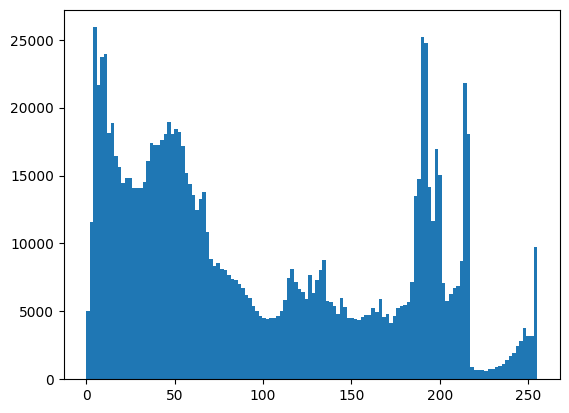

In [10]:
color_hist(WORK_SOURCE_PIC)

HIST_SOURCE_PIC = os.path.join(OUTPUT_DIR_1 , f'HIST_{WORK_SOURCE_PIC}')
plt.savefig(HIST_SOURCE_PIC)
plt.show()

In [11]:
# Load the image
img = cv2.imread(WORK_SOURCE_PIC)

noise_img_sp = random_noise(img, mode='s&p',amount=0.2)

im = Image.fromarray((noise_img_sp * 255).astype(np.uint8)).convert("L")
SP_PATH_FILE = os.path.join(OUTPUT_DIR_1 , f'sp_{SOURCE_PIC}')
im.save(SP_PATH_FILE)

im.show()

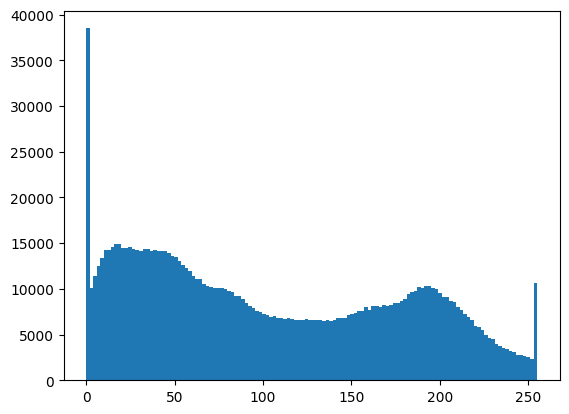

In [13]:
color_hist(SP_PATH_FILE)

SP_HIST_PATH_FILE = os.path.join(OUTPUT_DIR_1 , f'sp_HIST_{SOURCE_PIC}')
plt.savefig(SP_HIST_PATH_FILE)
plt.show()

In [14]:
noise_img_gauss = random_noise(img, mode="gaussian")

im = Image.fromarray((noise_img_gauss * 255).astype(np.uint8)).convert("L")
GAUSS_PATH_FILE = os.path.join(OUTPUT_DIR_1 , f'gaussian_{SOURCE_PIC}')
im.save(GAUSS_PATH_FILE)

im.show()

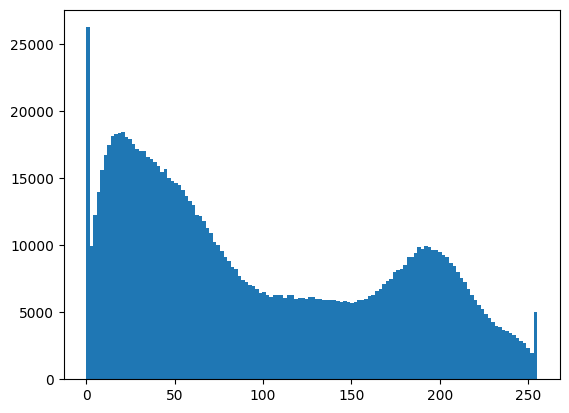

In [17]:
color_hist(GAUSS_PATH_FILE)

GAUSS_HIST_PATH_FILE = os.path.join(OUTPUT_DIR_1 , f'gaussian_HIST_{SOURCE_PIC}')
plt.savefig(GAUSS_HIST_PATH_FILE)
plt.show()

#### Noise Filters

In [10]:
def arithmetic_mean_filter(image, mask_size):
    height, width = image.shape
    result = np.zeros((height, width), dtype=np.uint8)

    half_mask_size = mask_size // 2

    for i in range(half_mask_size, height - half_mask_size):
        for j in range(half_mask_size, width - half_mask_size):
            neighbors = image[i - half_mask_size:i + half_mask_size + 1, j - half_mask_size:j + half_mask_size + 1]
            result[i, j] = np.mean(neighbors)

    return result

def geometric_mean_filter(image, mask_size):
    height, width = image.shape
    result = np.zeros((height, width), dtype=np.uint8)

    half_mask_size = mask_size // 2

    for i in range(half_mask_size, height - half_mask_size):
        for j in range(half_mask_size, width - half_mask_size):
            neighbors = image[i - half_mask_size:i + half_mask_size + 1, j - half_mask_size:j + half_mask_size + 1]
            result[i, j] = np.prod(neighbors) ** (1.0 / (mask_size * mask_size))

    return result

def harmonic_mean_filter(image, mask_size):
    height, width = image.shape
    result = np.zeros((height, width), dtype=np.uint8)

    half_mask_size = mask_size // 2

    for i in range(half_mask_size, height - half_mask_size):
        for j in range(half_mask_size, width - half_mask_size):
            neighbors = image[i - half_mask_size:i + half_mask_size + 1, j - half_mask_size:j + half_mask_size + 1]
            result[i, j] = (mask_size * mask_size) / np.sum(1.0 / (neighbors + 1e-8))

    return result

def median_filter(image, mask_size):
    height, width = image.shape
    result = np.zeros((height, width), dtype=np.uint8)

    half_mask_size = mask_size // 2

    for i in range(half_mask_size, height - half_mask_size):
        for j in range(half_mask_size, width - half_mask_size):
            neighbors = image[i - half_mask_size:i + half_mask_size + 1, j - half_mask_size:j + half_mask_size + 1]
            result[i, j] = np.median(neighbors)

    return result

In [93]:
def GaussieNoisy(image,sigma):
    #    .
    img = image.astype(np.int16)  # Этот шаг - избежать случая, когда точка пикселей меньше 0, превышает 255
    mu = 0
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            for k in range(img.shape[2]):
                img[i, j, k] = img[i, j, k] + random.gauss(mu=mu, sigma=sigma)
    img[img > 255] = 255
    img[img < 0] = 0
    img = img.astype(np.uint8)
    return img

def spNoisy(image,s_vs_p = 0.5,amount = 0.004):
    #  .
    out = np.copy(image)
    num_salt = np.ceil(amount * image.size * s_vs_p)
    coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image.shape]
    out[tuple(coords)] = 1
    num_pepper = np.ceil(amount* image.size * (1. - s_vs_p))
    coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape]
    out[tuple(coords)] = 0
    return out


def ArithmeticMeanAlogrithm(image):
    # Арифметический средний фильтр
    new_image = np.zeros(image.shape)
    image = cv2.copyMakeBorder(image,1,1,1,1,cv2.BORDER_DEFAULT)
    for i in range(1,image.shape[0]-1):
        for j in range(1,image.shape[1]-1):
            new_image[i-1,j-1] = np.mean(image[i-1:i+2,j-1:j+2])
    new_image = (new_image-np.min(image))*(255/np.max(image))
    return new_image.astype(np.uint8)
def rgbArithmeticMean(image):
    r,g,b = cv2.split(image)
    r = ArithmeticMeanAlogrithm(r)
    g = ArithmeticMeanAlogrithm(g)
    b = ArithmeticMeanAlogrithm(b)
    return cv2.merge([r,g,b])


def GeometricMeanOperator(roi):
    roi = roi.astype(np.float64)
    p = np.prod(roi)
    return p ** (1 / (roi.shape[0] * roi.shape[1]))
def GeometricMeanAlogrithm(image):
    # Геометрическая средняя фильтрация
    new_image = np.zeros(image.shape)
    image = cv2.copyMakeBorder(image, 1, 1, 1, 1, cv2.BORDER_DEFAULT)
    for i in range(1, image.shape[0] - 1):
        for j in range(1, image.shape[1] - 1):
            new_image[i - 1, j - 1] = GeometricMeanOperator(image[i - 1:i + 2, j - 1:j + 2])
    new_image = (new_image - np.min(image)) * (255 / np.max(image))
    return new_image.astype(np.uint8)
def rgbGemotriccMean(image):
    r,g,b = cv2.split(image)
    r = GeometricMeanAlogrithm(r)
    g = GeometricMeanAlogrithm(g)
    b = GeometricMeanAlogrithm(b)
    return cv2.merge([r,g,b])


def HarmonicMeanOperator(roi):
    roi = roi.astype(np.float64)
    if 0 in roi:
        roi = 0
    else:
        roi = scipy.stats.hmean(roi.reshape(-1))
    return roi
def HarmonicMeanAlogrithm(image):
    # Гармонический средний фильтр
    new_image = np.zeros(image.shape)
    image = cv2.copyMakeBorder(image,1,1,1,1,cv2.BORDER_DEFAULT)
    for i in range(1,image.shape[0]-1):
        for j in range(1,image.shape[1]-1):
            new_image[i-1,j-1] =HarmonicMeanOperator(image[i-1:i+2,j-1:j+2])
    new_image = (new_image-np.min(image))*(255/np.max(image))
    return new_image.astype(np.uint8)
def rgbHarmonicMean(image):
    r,g,b = cv2.split(image)
    r = HarmonicMeanAlogrithm(r)
    g = HarmonicMeanAlogrithm(g)
    b = HarmonicMeanAlogrithm(b)
    return cv2.merge([r,g,b])


def Contra_harmonicMeanOperator(roi,q):
    roi = roi.astype(np.float64)
    return np.mean((roi)**(q+1))/np.mean((roi)**(q))
def Contra_harmonicMeanAlogrithm(image,q):
    # Обратная гармонический средний фильтр
    new_image = np.zeros(image.shape)
    image = cv2.copyMakeBorder(image,1,1,1,1,cv2.BORDER_DEFAULT)
    for i in range(1,image.shape[0]-1):
        for j in range(1,image.shape[1]-1):
            new_image[i-1,j-1] = Contra_harmonicMeanOperator(image[i-1:i+2,j-1:j+2],q)
    new_image = (new_image-np.min(image))*(255/np.max(image))
    return new_image.astype(np.uint8)
def rgbContra_harmonicMean(image,q):
    r,g,b = cv2.split(image)
    r = Contra_harmonicMeanAlogrithm(r,q)
    g = Contra_harmonicMeanAlogrithm(g,q)
    b = Contra_harmonicMeanAlogrithm(b,q)
    return cv2.merge([r,g,b])

#### MAIN (Continue)

In [11]:
Gauss_Filtered_DIR = os.path.join(OUTPUT_DIR_1,f"Gauss_Filtered")
if not os.path.exists(Gauss_Filtered_DIR):
    os.makedirs(Gauss_Filtered_DIR)
Gauss_Filtered_Hist_DIR = os.path.join(OUTPUT_DIR_1,f"Gauss_Filtered_Hist")
if not os.path.exists(Gauss_Filtered_Hist_DIR):
    os.makedirs(Gauss_Filtered_Hist_DIR)
    
SP_Filtered_DIR = os.path.join(OUTPUT_DIR_1,f"SP_Filtered")
if not os.path.exists(SP_Filtered_DIR):
    os.makedirs(SP_Filtered_DIR)
SP_Filtered_Hist_DIR = os.path.join(OUTPUT_DIR_1,f"SP_Filtered_Hist")
if not os.path.exists(SP_Filtered_Hist_DIR):
    os.makedirs(SP_Filtered_Hist_DIR)

##### S&P

In [12]:
# Применение фильтров
sp_image = cv2.imread(SP_PATH_FILE, cv2.IMREAD_GRAYSCALE)

mask_size = 3

sp_filtered = dict()
sp_filtered_PIL = dict()
sp_filtered_path = dict()
sp_filtered_hist_path = dict()

# Среднегеометрический фильтр
sp_filtered["geometric"] = geometric_mean_filter(
    sp_image,
    mask_size
    )
# Среднееарифмитический фильтр
sp_filtered["arithmetic"] = arithmetic_mean_filter(
    sp_image,
    mask_size
    )
# Cреднегармонический фильтр
sp_filtered["harmonic"] = harmonic_mean_filter(
    sp_image,
    mask_size
    )
# Медианный  фильтр
sp_filtered["median"] = median_filter(
    sp_image,
    mask_size
    )

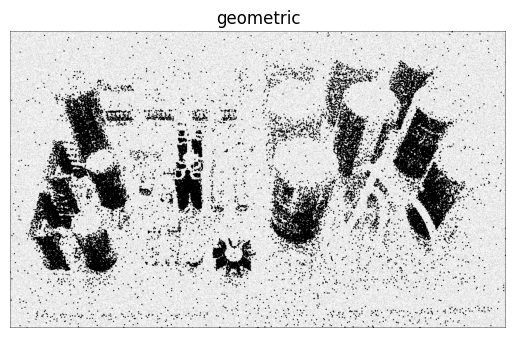

In [57]:
_case_ = "geometric"
sp_filtered_PIL[_case_] = Image.fromarray((sp_filtered[_case_]).astype(np.uint8))

sp_filtered_path[_case_] = os.path.join(SP_Filtered_DIR , _case_+f'_sp_{SOURCE_PIC}')
# sp_filtered_PIL[_case_].save(sp_filtered_path[_case_])


# plt.figure(figsize=(16,16))
plt.title(_case_ ) 
plt.imshow(sp_filtered_PIL[_case_],cmap="gray")
plt.axis('off')
plt.savefig(sp_filtered_path[_case_])
plt.show()

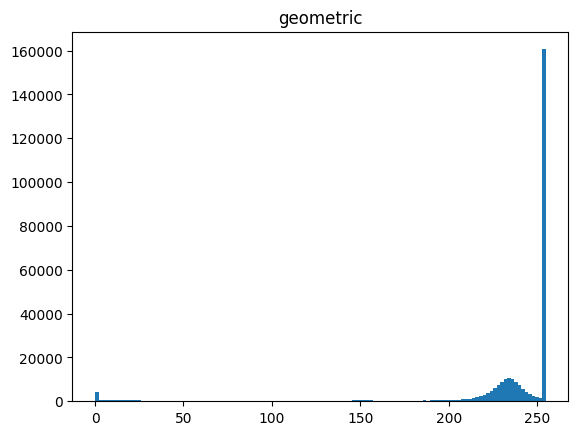

In [58]:
_case_ = "geometric"
color_hist(sp_filtered_path[_case_])

sp_filtered_hist_path[_case_] = os.path.join(SP_Filtered_Hist_DIR , _case_+f'_sp_HIST_{SOURCE_PIC}')
plt.title(_case_ )#+ " hist")
plt.savefig(sp_filtered_hist_path[_case_])
plt.show()

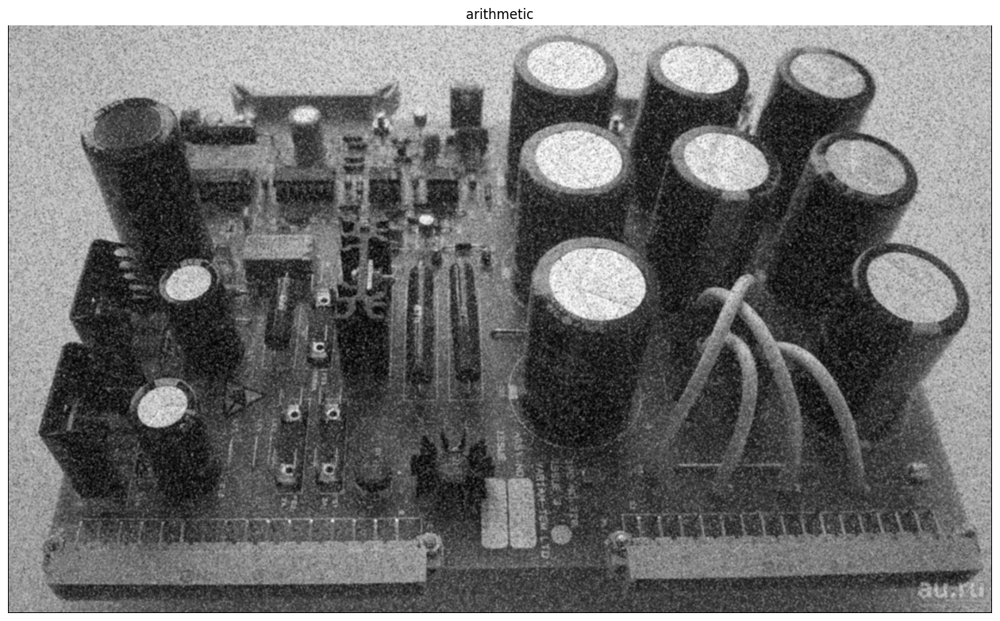

In [22]:
_case_ = "arithmetic"
sp_filtered_PIL[_case_] = Image.fromarray((sp_filtered[_case_]).astype(np.uint8))

sp_filtered_path[_case_] = os.path.join(SP_Filtered_DIR , _case_+f'_sp_{SOURCE_PIC}')
sp_filtered_PIL[_case_].save(sp_filtered_path[_case_])


plt.figure(figsize=(16,16))
plt.title(_case_ ) 
plt.imshow(sp_filtered_PIL[_case_],cmap="gray")
plt.axis('off')
# plt.savefig(sp_filtered_path[_case_])
plt.show()

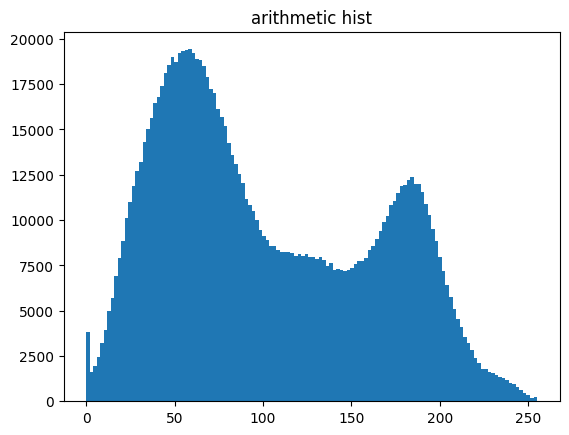

In [23]:
_case_ = "arithmetic"
color_hist(sp_filtered_path[_case_])

sp_filtered_hist_path[_case_] = os.path.join(SP_Filtered_Hist_DIR , _case_+f'_sp_HIST_{SOURCE_PIC}')
plt.savefig(sp_filtered_hist_path[_case_])
plt.title(_case_ + " hist")
plt.show()

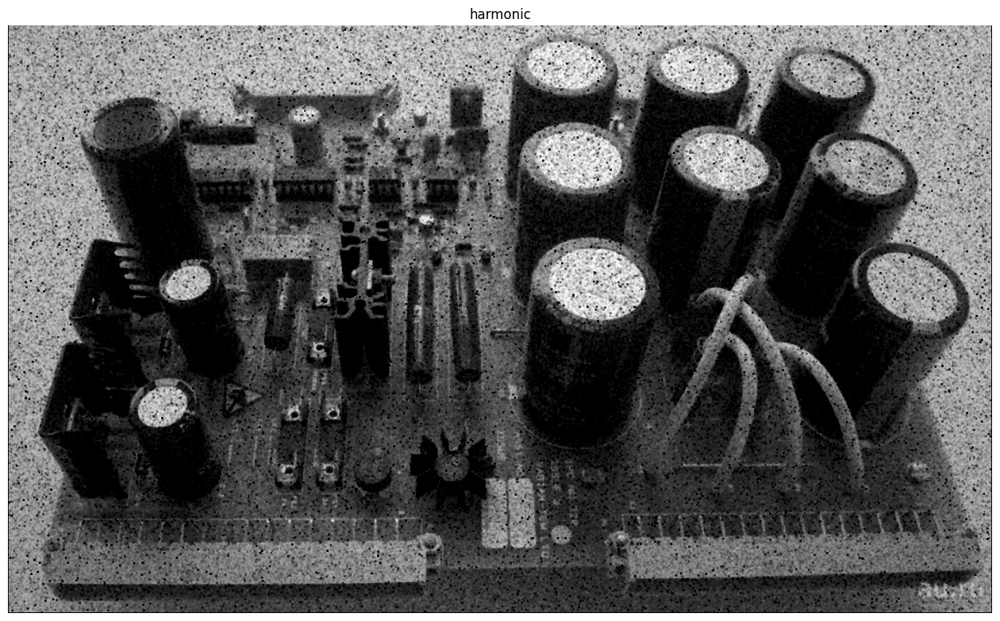

In [24]:
_case_ = "harmonic"

sp_filtered_PIL[_case_] = Image.fromarray((sp_filtered[_case_]).astype(np.uint8))

sp_filtered_path[_case_] = os.path.join(SP_Filtered_DIR , _case_+f'_sp_{SOURCE_PIC}')
sp_filtered_PIL[_case_].save(sp_filtered_path[_case_])


plt.figure(figsize=(16,16))
plt.title(_case_ ) 
plt.imshow(sp_filtered_PIL[_case_],cmap="gray")
plt.axis('off')
# plt.savefig(sp_filtered_path[_case_])
plt.show()

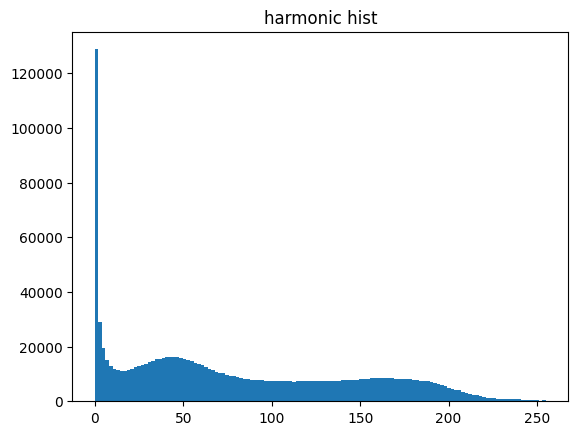

In [25]:
_case_ = "harmonic"
color_hist(sp_filtered_path[_case_])

sp_filtered_hist_path[_case_] = os.path.join(SP_Filtered_Hist_DIR , _case_+f'_sp_HIST_{SOURCE_PIC}')
plt.savefig(sp_filtered_hist_path[_case_])
plt.title(_case_ + " hist")
plt.show()

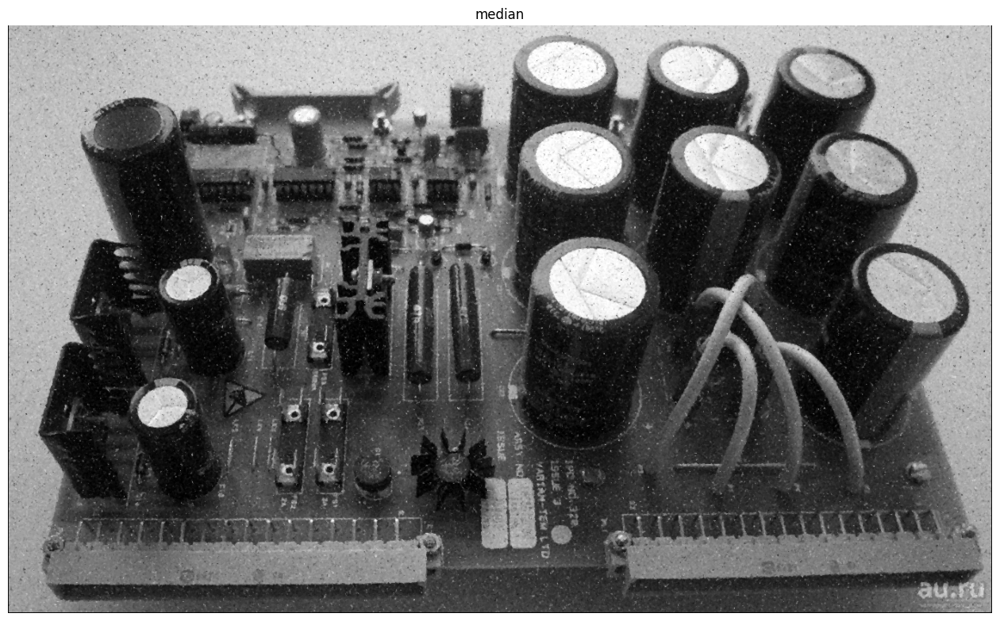

In [26]:
_case_ = "median"

sp_filtered_PIL[_case_] = Image.fromarray((sp_filtered[_case_]).astype(np.uint8))

sp_filtered_path[_case_] = os.path.join(SP_Filtered_DIR , _case_+f'_sp_{SOURCE_PIC}')
sp_filtered_PIL[_case_].save(sp_filtered_path[_case_])


plt.figure(figsize=(16,16))
plt.title(_case_ ) 
plt.imshow(sp_filtered_PIL[_case_],cmap="gray")
plt.axis('off')
# plt.savefig(sp_filtered_path[_case_])
plt.show()

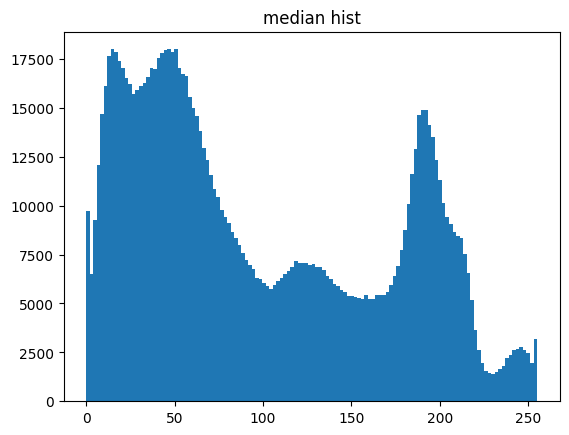

In [27]:
_case_ = "median"

color_hist(sp_filtered_path[_case_])

sp_filtered_hist_path[_case_] = os.path.join(SP_Filtered_Hist_DIR ,  _case_+f'_sp_HIST_{SOURCE_PIC}')
plt.title(_case_ + " hist")
plt.savefig(sp_filtered_hist_path[_case_])
plt.show()

##### GAUSSIAN

In [38]:
# Применение фильтров
gauss_image = cv2.imread(GAUSS_PATH_FILE, cv2.IMREAD_GRAYSCALE)
mask_size = 3

gauss_filtered = dict()
gauss_filtered_PIL = dict()
gauss_filtered_path = dict()
gauss_filtered_hist_path = dict()

gauss_filtered["geometric"] = geometric_mean_filter(
    gauss_image,
    mask_size
    )
# Среднееарифмитический фильтр
gauss_filtered["arithmetic"] = arithmetic_mean_filter(
    gauss_image,
    mask_size
    )
# Cреднегармонический фильтр
gauss_filtered["harmonic"] = harmonic_mean_filter(
    gauss_image,
    mask_size
    )
# Медианный  фильтр
gauss_filtered["median"] = median_filter(
    gauss_image,
    mask_size
    )

###### geometric

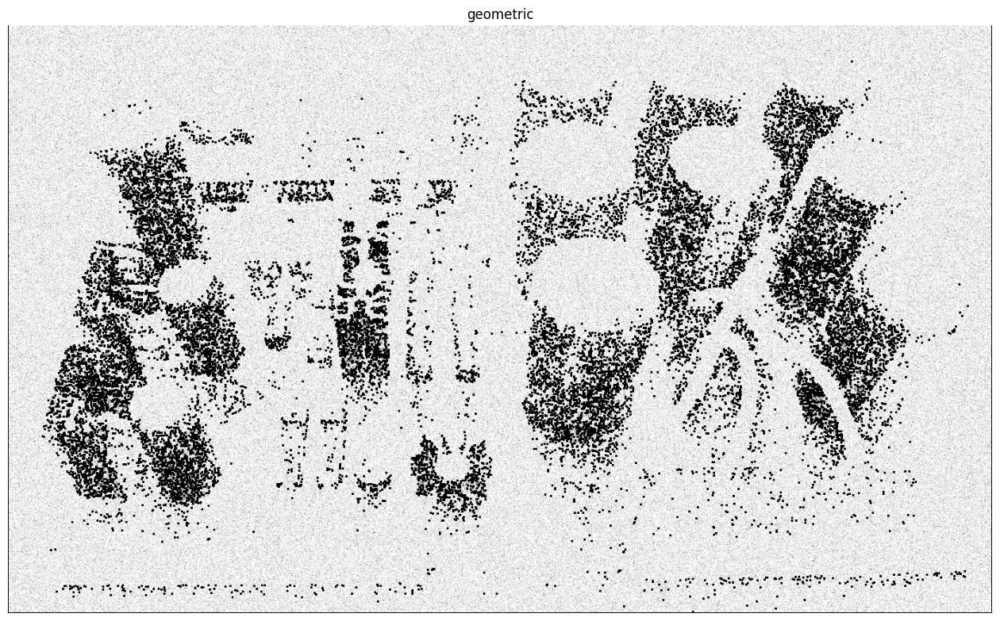

In [39]:
_case_ = "geometric"

gauss_filtered_PIL[_case_] = Image.fromarray((gauss_filtered[_case_]).astype(np.uint8))

gauss_filtered_path[_case_] = os.path.join(Gauss_Filtered_DIR , _case_ + f'_gauss_{SOURCE_PIC}')
# gauss_filtered_PIL[_case_].save(gauss_filtered_path[_case_])


plt.figure(figsize=(16,16))
plt.title(_case_ ) 
plt.imshow(gauss_filtered_PIL[_case_],cmap="gray")
plt.axis('off')
plt.savefig(gauss_filtered_path[_case_])
plt.show()

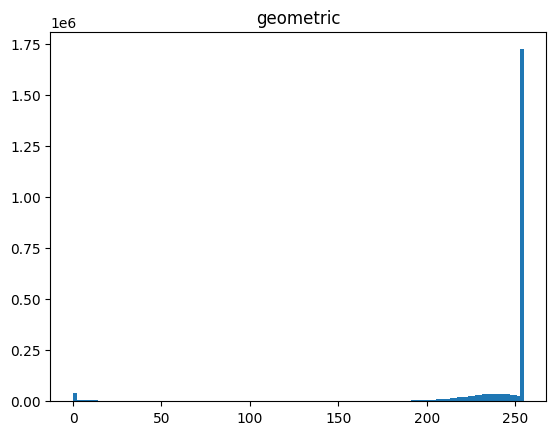

In [40]:
_case_ = "geometric"

color_hist(gauss_filtered_path[_case_])

gauss_filtered_hist_path[_case_] = os.path.join(Gauss_Filtered_Hist_DIR , _case_+f'_gauss_HIST_{SOURCE_PIC}')
plt.savefig(gauss_filtered_hist_path[_case_])
plt.title(_case_ )#+ " hist")
plt.show()

###### arithmetic

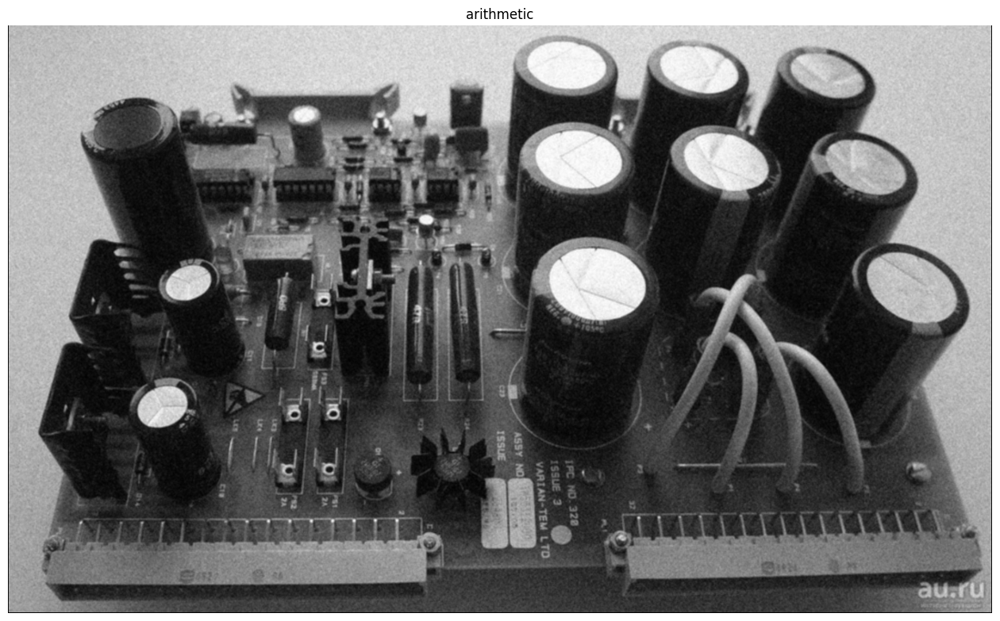

In [41]:
_case_ = "arithmetic"

gauss_filtered_PIL[_case_] = Image.fromarray((gauss_filtered[_case_]).astype(np.uint8))

gauss_filtered_path[_case_] = os.path.join(Gauss_Filtered_DIR , _case_ + f'_gauss_{SOURCE_PIC}')
gauss_filtered_PIL[_case_].save(gauss_filtered_path[_case_])


plt.figure(figsize=(16,16))
plt.title(_case_ ) 
plt.imshow(gauss_filtered_PIL[_case_],cmap="gray")
plt.axis('off')
# plt.savefig(gauss_filtered_path[_case_])
plt.show()

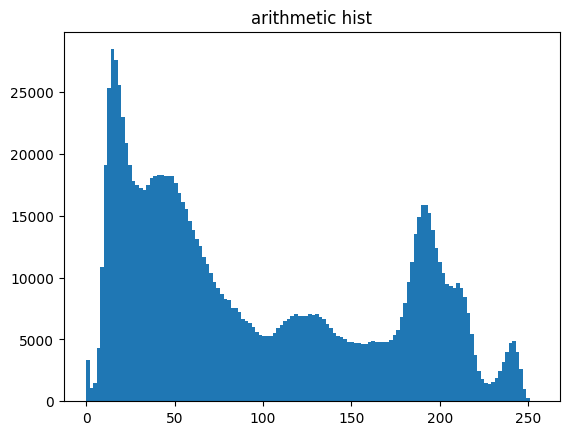

In [42]:
_case_ = "arithmetic"

color_hist(gauss_filtered_path[_case_])

gauss_filtered_hist_path[_case_] = os.path.join(Gauss_Filtered_Hist_DIR , _case_+f'_gauss_HIST_{SOURCE_PIC}')
plt.savefig(gauss_filtered_hist_path[_case_])
plt.title(_case_ + " hist")
plt.show()

###### harmonic

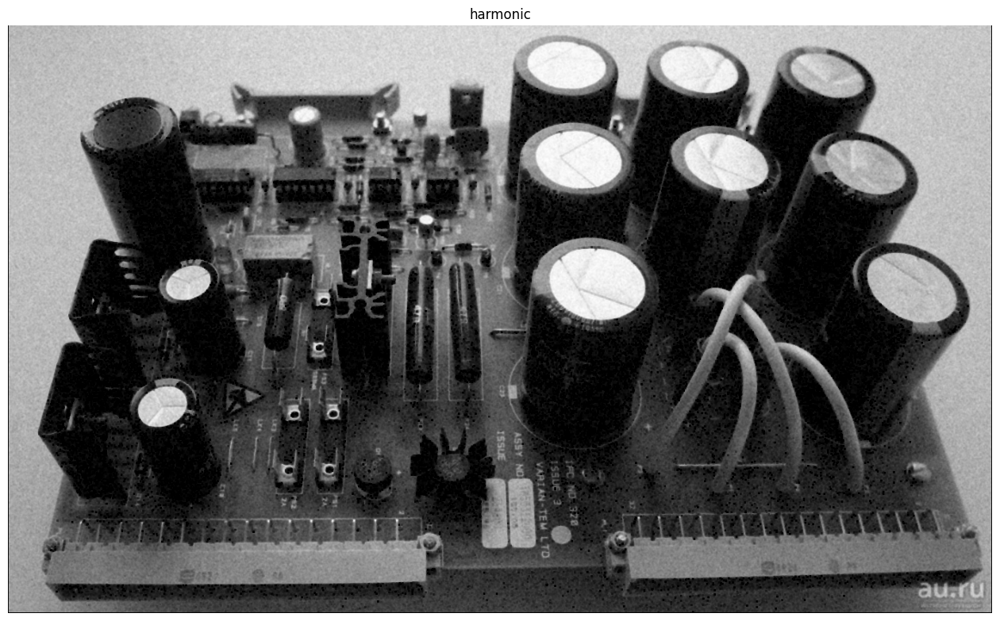

In [43]:
_case_ = "harmonic"

gauss_filtered_PIL[_case_] = Image.fromarray((gauss_filtered[_case_]).astype(np.uint8))

gauss_filtered_path[_case_] = os.path.join(Gauss_Filtered_DIR , _case_ + f'_gauss_{SOURCE_PIC}')
gauss_filtered_PIL[_case_].save(gauss_filtered_path[_case_])

plt.figure(figsize=(16,16))
plt.title(_case_ ) 
plt.imshow(gauss_filtered_PIL[_case_],cmap="gray")
plt.axis('off')
# plt.savefig(gauss_filtered_path[_case_])
plt.show()

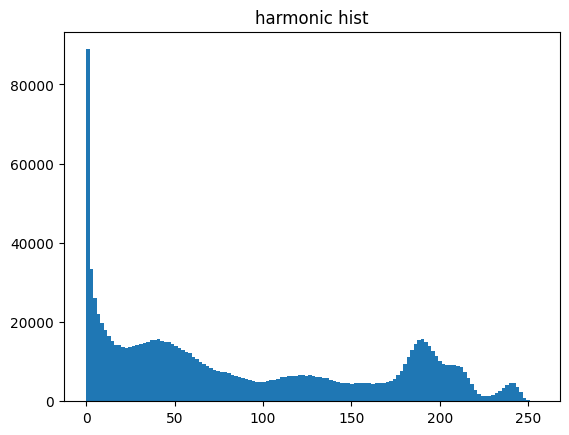

In [128]:
_case_ = "harmonic"

color_hist(gauss_filtered_path[_case_])

gauss_filtered_hist_path[_case_] = os.path.join(Gauss_Filtered_Hist_DIR , _case_+f'_gauss_HIST_{SOURCE_PIC}')
plt.savefig(gauss_filtered_hist_path[_case_])
plt.title(_case_ + " hist")
plt.show()

###### median

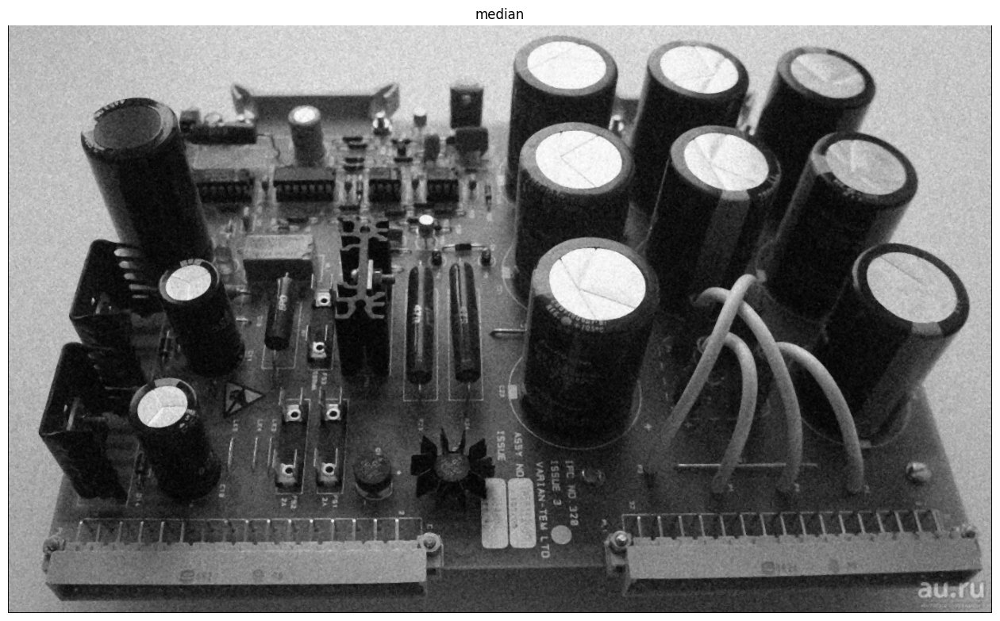

In [44]:
_case_ = "median"

gauss_filtered_PIL[_case_] = Image.fromarray((gauss_filtered[_case_]).astype(np.uint8))

gauss_filtered_path[_case_] = os.path.join(Gauss_Filtered_DIR , _case_ + f'_gauss_{SOURCE_PIC}')
gauss_filtered_PIL[_case_].save(gauss_filtered_path[_case_])


plt.figure(figsize=(16,16))
plt.title(_case_ ) 
plt.imshow(gauss_filtered_PIL[_case_],cmap="gray")
plt.axis('off')
# plt.savefig(gauss_filtered_path[_case_])
plt.show()

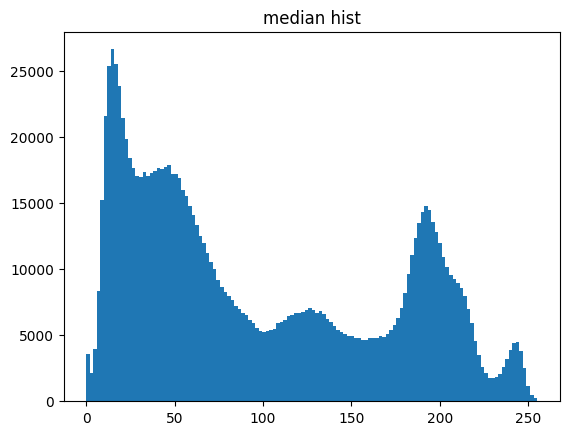

In [45]:
_case_ = "median"

color_hist(gauss_filtered_path[_case_])

gauss_filtered_hist_path[_case_] = os.path.join(Gauss_Filtered_Hist_DIR , _case_+f'_gauss_HIST_{SOURCE_PIC}')
plt.savefig(gauss_filtered_hist_path[_case_])
plt.title(_case_ + " hist")
plt.show()

## 2

**Использование пространственных фильтров для повышения резкости изображения.**
1. Использование Лапласиана.
* Используя расфокусировку с помощью гауссовского фильтра получите слегка размытое изображение.
* Используя Лапласиан улучшите резкость изображения. Путем анализа некоторых деталей изображения (букв, символов, мелких деталей) сделайте выводы о степени улучшения изображения в результате использования Лапласиана (например, стали ли читаться буквы, насколько лучше видны отдельные детали и т.д.).
* * Используйте две функции Matlab: imfilter с маской Лапласиана и locallapfilt.
* Сравните результаты улучшения изображения.
2. Использование маски Собела.
* Используя такую же расфокусировку заданного изображения, что и в п. 1, улучшите резкость с помощью масочного фильтра Собела.
3. Сравните эффективность работы двух алгоритмов улучшения резкости изображения: Лапласиана и оператора Собела.

In [46]:
def matlab_style_gauss2D(shape=(3,3),sigma=0.5):
    """
    2D gaussian mask - should give the same result as MATLAB's
    fspecial('gaussian',[shape],[sigma])
    """
    m,n = [(ss-1.)/2. for ss in shape]
    y,x = np.ogrid[-m:m+1,-n:n+1]
    h = np.exp( -(x*x + y*y) / (2.*sigma*sigma) )
    h[ h < np.finfo(h.dtype).eps*h.max() ] = 0
    sumh = h.sum()
    if sumh != 0:
        h /= sumh
    return h

def sharpen_image_sobel(image):
    # Преобразование изображения в оттенки серого
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Определение ядер Собеля для вычисления градиентов
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=np.float32)
    sobel_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], dtype=np.float32)

    # Применение оператора Собеля к изображению
    gradient_x = cv2.filter2D(gray, -1, sobel_x)
    gradient_y = cv2.filter2D(gray, -1, sobel_y)

    # Комбинирование градиентов для получения улучшенного изображения
    sharpened = cv2.addWeighted(gray, 1, gradient_x + gradient_y, -1, 0)

    # Масштабирование значений пикселей для получения корректного отображения
    sharpened = np.uint8(np.clip(sharpened, 0, 255))

    # Возвращение улучшенного изображения
    return sharpened


def sharpen_image_laplacian(image):
    # Преобразование изображения в оттенки серого
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Применение фильтра лапласиана
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)

    # Масштабирование значений пикселей для получения корректного отображения
    sharpened = np.uint8(np.clip(gray - laplacian, 0, 255))

    # Возвращение улучшенного изображения
    return sharpened

def make_subplots(args:list,titles:list ,size:int=15):
    assert len(args) == len(titles)
    
    

    fig = plt.figure(figsize=(size,size))
    for i in range(len(args)):
        ax_i = fig.add_subplot(1,len(args),i+1)
        ax_i.imshow(args[i], cmap="gray")
        ax_i.title.set_text(titles[i])
    plt.show()

In [59]:
def laplacian_sharpen(image,A:int=4):
    # Convert the image to a numpy array
    image_array = np.array(image, dtype=np.float32)
    # Define the Laplacian kernel
    laplacian_kernel = np.array(
        [
            [1, 1, 1],
            [1, -A, 1],
            [1, 1, 1]
            ]
        )
    # Apply the Laplacian filter
    filtered_array = convolve(
        image_array, 
        laplacian_kernel
        )  
    # Normalize the filtered array
    filtered_array = (filtered_array - np.min(filtered_array)) \
                / (
                    np.max(filtered_array) - np.min(filtered_array)
                    )    
    # Convert the filtered array back to image
    sharpened_image = Image.fromarray(
        (filtered_array * 255).astype(np.uint8)
        )
    # Show the result image
    return sharpened_image

def sobel_sharpen(image):
    # Apply the Sobel operator
    sobel_x = image.filter(ImageFilter.FIND_EDGES)
    sobel_y = image.transpose(Image.TRANSPOSE).filter(
        ImageFilter.FIND_EDGES
        ).transpose(Image.TRANSPOSE)
    # Combine the horizontal and vertical edges
    sobel_combined = ImageChops.add(
        sobel_x, 
        sobel_y
        )
    # Enhance the edges for sharpening effect
    enhanced_image = ImageEnhance.Contrast(sobel_combined).enhance(2.0)
    # Blend the enhanced edges with the original image
    sharpened_image = Image.blend(image, enhanced_image, 0.5)
    return sharpened_image

In [60]:
SOURCE_PIC = "Img3_08_1.jpg"
cwd = os.getcwd()
task_2 = 2
OUTPUT_DIR_2 = os.path.join(cwd,f"task_3-{task_2}")
if not os.path.exists(OUTPUT_DIR_2):
    os.makedirs(OUTPUT_DIR_2)
    

img = Image.open(SOURCE_PIC).convert("L")
WORK_SOURCE_PIC = f"BW_{SOURCE_PIC}"
img.save(WORK_SOURCE_PIC)
img.show()

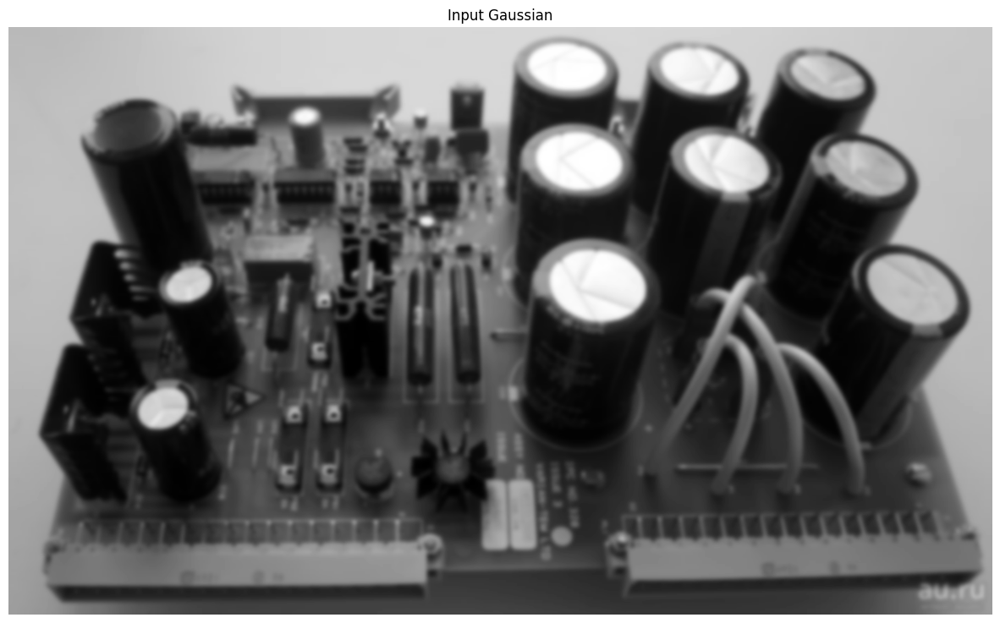

In [50]:
noise_img_sp = gaussian_filter(img, sigma=3)

im = Image.fromarray((noise_img_sp).astype(np.uint8)).convert("L")
Gauss_PATH_FILE = os.path.join(OUTPUT_DIR_2 , f'Gauss_{SOURCE_PIC}')
im.save(Gauss_PATH_FILE)

fig = plt.figure(figsize=(15,15))
plt.imshow(im,cmap="gray")
plt.title("Input Gaussian")
plt.axis('off')
plt.show()

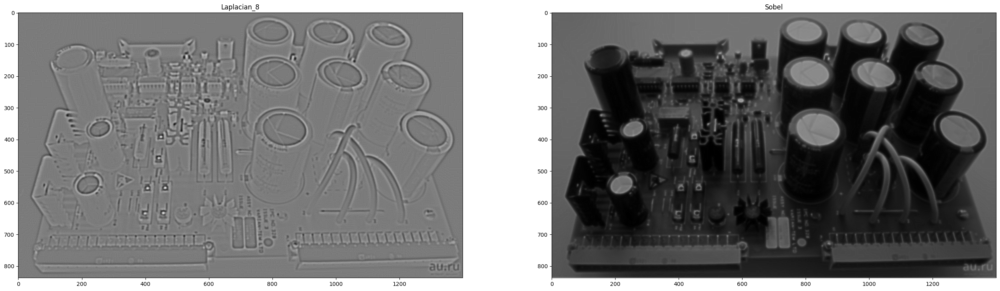

In [61]:
# convolute with proper kernels
A = 8
laplacian = laplacian_sharpen(Image.fromarray(noise_img_sp),A=A)
sobel = sobel_sharpen(Image.fromarray(noise_img_sp))
# Make an example plot with two subplots..


make_subplots(
    [
        # noise_img_sp,
        laplacian,
        sobel
        ],
    [
        # "orig",
        f"Laplacian_{A}",
        "Sobel"
     ],size=32)

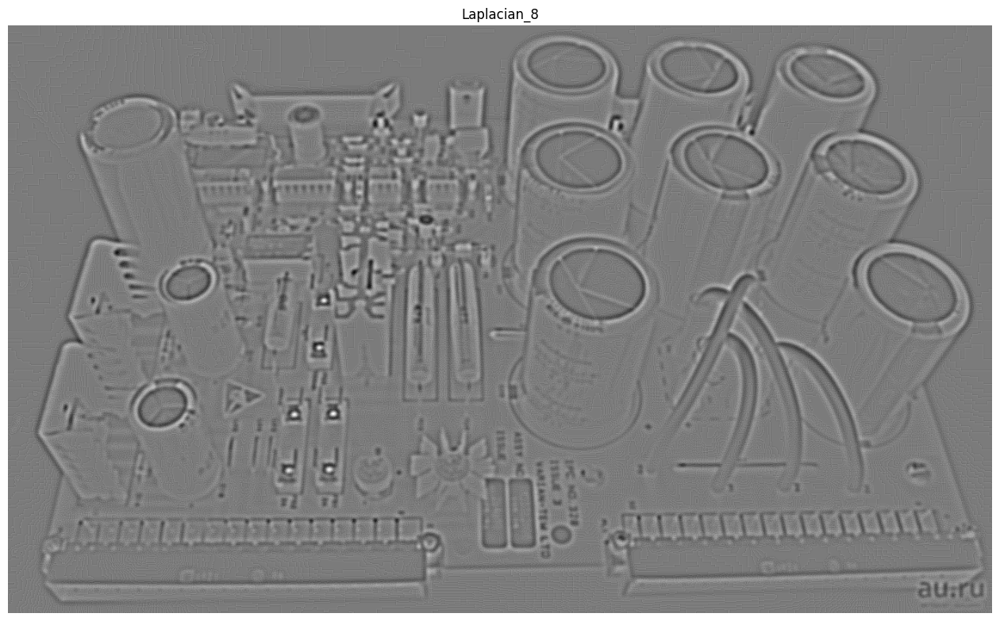

In [62]:
im = laplacian
laplacian_FILTER_PATH_FILE = os.path.join(OUTPUT_DIR_2 , f'laplacian_FILTER_gauss_{SOURCE_PIC}')
laplacian.save(laplacian_FILTER_PATH_FILE)

fig = plt.figure(figsize=(16,16))
plt.imshow(laplacian,cmap="gray")
plt.title(f"Laplacian_{A}")  
plt.axis('off')
# plt.savefig(gauss_filtered_path[_case_])
plt.show() 

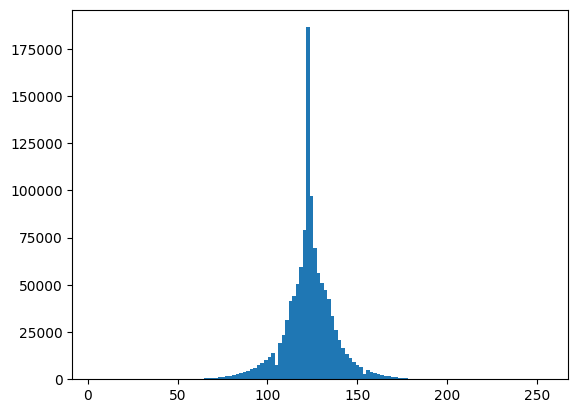

<Figure size 1600x1600 with 0 Axes>

In [64]:
color_hist(laplacian_FILTER_PATH_FILE)
fig = plt.figure(figsize=(16,16))
laplacian_FILTER_HIST_PATH_FILE = os.path.join(OUTPUT_DIR_2 , f'laplacian_FILTER_gauss_HIST.png')
plt.savefig(laplacian_FILTER_HIST_PATH_FILE)
plt.show()

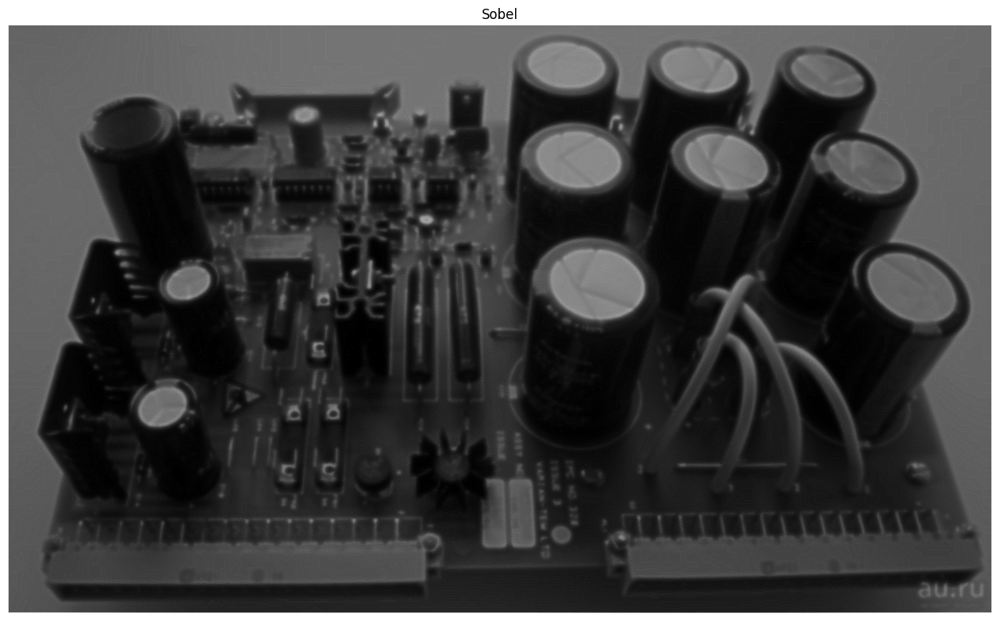

In [65]:
sobel_FILTER_PATH_FILE = os.path.join(OUTPUT_DIR_2 , f'sobel_FILTER_gauss_{SOURCE_PIC}')
sobel.save(sobel_FILTER_PATH_FILE)

fig = plt.figure(figsize=(16,16))
plt.imshow(sobel,cmap="gray")
plt.title("Sobel")

plt.axis('off')
plt.show()

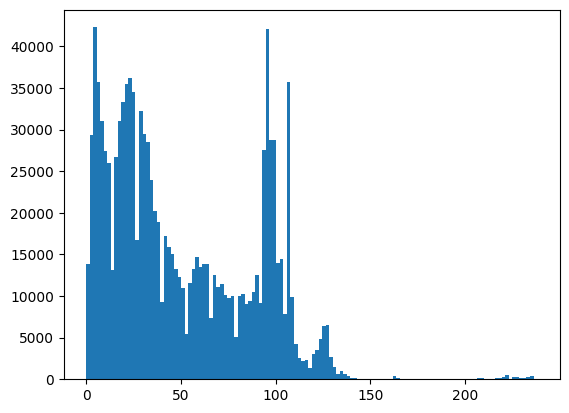

<Figure size 1600x1600 with 0 Axes>

In [66]:
color_hist(sobel_FILTER_PATH_FILE)
fig = plt.figure(figsize=(16,16))
sobelx_FILTER_HIST_PATH_FILE = os.path.join(OUTPUT_DIR_2 , f'sobelx_FILTER_gauss_HIST')
plt.savefig(sobelx_FILTER_HIST_PATH_FILE)
plt.show()